# Исследование рынка общественного питания Москвы 

В нашем распоряжении набор данных с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках.

**Цель исследования**

* Определить общую структуру рынка общественного питания Москвы.
* Выявить основные тенденции и закономерности развития рынка, включая распределение по округам, типам заведений и ценовым категориям.
* определить наиболее перспективные районы Москвы для открытия кофейни 

**Описание данных**

Файл `moscow_places.csv`:

* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    Ё
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
     - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
     - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
     - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
     - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
     - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
     - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
     - 0 — заведение не является сетевым
     - 1 — заведение является сетевым
* `district` — административный район, в котором находится заведение, например Центральный административный округ;
* `seats` — количество посадочных мест.

**План исследования**

Данные мы получили из `moscow_places.csv`. О качестве данных пока ничего не известно.
Поэтому перед проведением исследовательского анализа и проверкой гипотез нам понадобится обзор данных.

Таким образом, исследование пройдёт в несколько этапов:

1 — Обзор данных\
2 — Предобработка данных\
3 — Исследовательский анализ\
4 — Общий вывод

## Загрузка данных и изучение общей информации

In [1]:
#импорт библиотек Python
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from IPython.display import display_html
import folium
import warnings

In [2]:
warnings.filterwarnings('ignore')#отключаем предупреждения об изменениях в библиотеках
path = ''
data = pd.read_csv(path + 'moscow_places.csv') #сохраняем датасет в переменную 'data'

**Посмотрим на первые 5 строк датасета и применим метод info()**

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Промежуточные выводы

* датасет содержит информацию о **8406 заведениях**
* в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats` есть пропуски
* столбцы содержат информацию типа object и float64. Исключение — столбец `chain` стоит поменять на булев тип.
* следует проверить датасет на наличие явных и скрытых дубликатов

## Предобработка данных

### Поиск дубликатов

Сначала проверим датасет на наличие полностью повторяющихся строк:

In [5]:
display(data.duplicated().sum())

0

Таких строк нет, теперь перейдем к поиску скрытых дубликатов:

Заведения могут повториться, если у них одинаковые названия и адрес.
Проверим датафрейм на дубли по этим двум столбцам, предварительно поменяв регистр в этих столбцах на нижний.

In [6]:
#меняем регистр на нижний
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

#ищем строки по одинаковым значениям в столбцах `name` и `address`, выводим на экран оба дубля
data[data[['name','address']].duplicated(keep=False) == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


В полученной таблице 4 заведения:

* кафе на Ангарских прудах
* more poke	на Волоколамском шоссе
* раковарня клешни и хвосты	на Проспекте мира
* хлеб да выпечка на Ярцевской улице

У первых 2-х строк (название — `кафе`) разные координаты, и в адресе указан парк Ангарские пруды. Скорее всего это не дубли, а два кафе, стоящие недалеко друг от друга на территории парка. Проверим эту гипотезу, найдя эти кафе по координатам в Яндекс.Картах:\
строка_189 — <https://yandex.ru/maps/-/CDD4NYJK><br>
строка_215 — <https://yandex.ru/maps/-/CDD4NKzK>

Это действительно два разных кафе. Можно было бы присвоить им названия из Яндекс.Карт, но, учитывая что датафрейм у нас за 2022 год, а сейчас — 2024, это было бы некорректно.

---

По остальным трем заведениям можно предположить, что это действительно дубли, судя по уникальным названиям.

Удалим три дубля из датафрейма:

In [7]:
data = data.drop([1430,2211,3091])

Теперь проверим столбцы `category`, `district` и `price`, содержащие названия категорий на наличие ошибок.

In [8]:
#выводим на экран уникальные значения столбцов
display(data['category'].unique())
display(data['district'].unique())
display(data['price'].unique())

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Ошибок в написаниях нет.

#### Работа с пропусками

Выше мы выяснили, что в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats` есть пропуски.

Попробуем разобраться, что они могут означать и решим, заполнять их или оставить.

In [9]:
#выведем 5 первых строк столбцов с пропусками на экран и уточним количество пропусков методом info()
display(data[['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup','seats']].info())

data[['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup','seats']].head()

<class 'pandas.core.frame.DataFrame'>
Index: 8403 entries, 0 to 8405
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   hours              7867 non-null   object 
 1   price              3315 non-null   object 
 2   avg_bill           3816 non-null   object 
 3   middle_avg_bill    3149 non-null   float64
 4   middle_coffee_cup  535 non-null    float64
 5   seats              4792 non-null   float64
dtypes: float64(3), object(3)
memory usage: 459.5+ KB


None

,hours,price,avg_bill,middle_avg_bill,middle_coffee_cup,seats
0,"ежедневно, 10:00–22:00",NaN,NaN,NaN,NaN,NaN
1,"ежедневно, 10:00–22:00",выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,4.0
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",средние,Средний счёт:от 1000 ₽,1000.0,NaN,45.0
3,"ежедневно, 09:00–22:00",NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,NaN
4,"ежедневно, 10:00–22:00",средние,Средний счёт:400–600 ₽,500.0,NaN,148.0


* Столбцы `hours`, `price`, `avg_bill` — содержат строковые данные, заменим пропуски на 'unknown'.

* Столбцы `middle_avg_bill`, `middle_coffee_cup`, `seats` — содержат данные типа float64. Для этих столбцов сделаем "заглушку" для пропусков `-1`.

In [10]:
data['hours'] = data['hours'].fillna('unknown')
data['price'] = data['price'].fillna('unknown')
data['avg_bill'] = data['avg_bill'].fillna('unknown')

data['middle_avg_bill'] = data['middle_avg_bill'].fillna(-1)
data['middle_coffee_cup'] = data['middle_coffee_cup'].fillna(-1)
data['seats'] = data['seats'].fillna(-1)

#### Изменение типов данных

Изменим тип столбца `chain` на bool

In [11]:
data['chain'] = data['chain'].astype(bool)

#### Добавление новых столбцов
---

Добавим новые столбцы:

* Столбец `street` с названиями улиц.
* Столбец `is_24_7` с информацией, работает ли заведение ежедневно и круглосуточно (24/7). Столбец будет содержать булев тип данных. 

In [12]:
data['street'] = data['address'].str.split(",").str[1] #создаем столбец street
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно' #создаем столбец is_24_7

data.head()#выводим первые 5 строк получившейся таблицы на экран

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,-1.0,-1.0,False,-1.0,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,False,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,False,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,-1.0,170.0,False,-1.0,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,True,148.0,правобережная улица,False


#### Поиск аномальных значений

---

Проверим столбцы, содержащие числовые значения на аномалии. Такие столбцы:
* `lat`
* `lng`
* `rating`
* `middle_avg_bill`
* `middle_coffee_cup`
* `seats`

Посмотрим гистограммы распределения значений для этих столбцов:

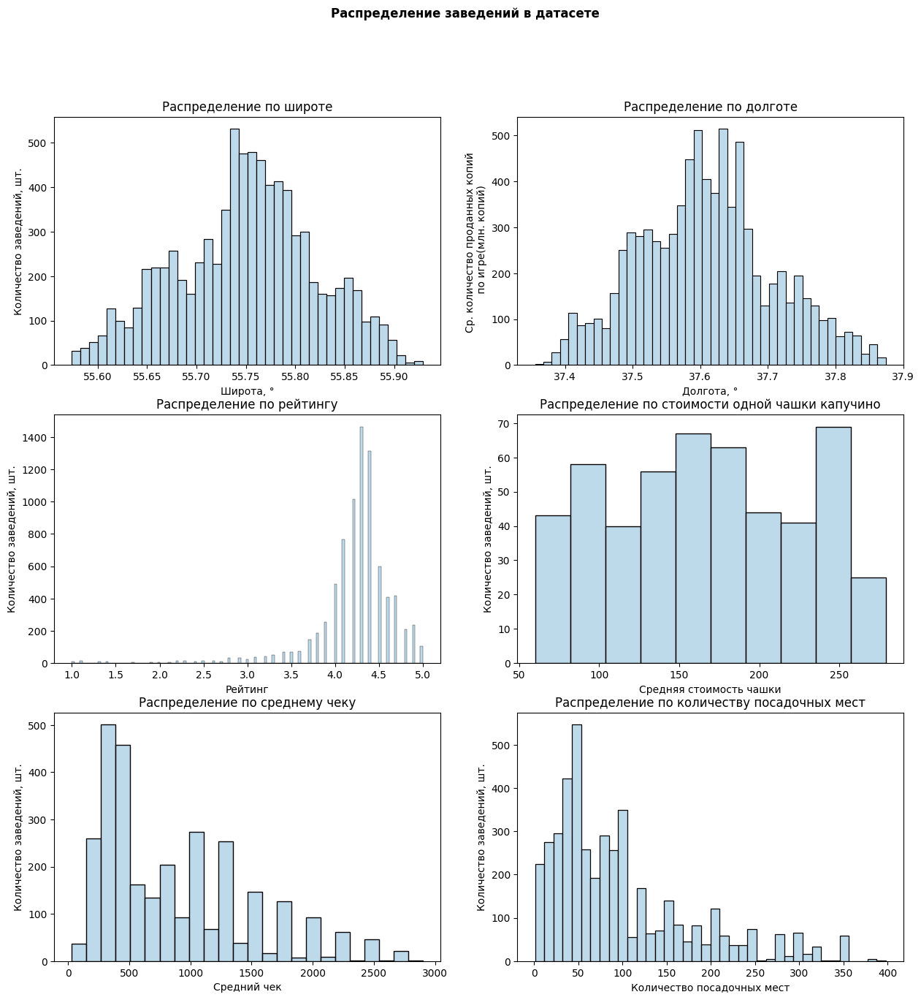

In [69]:
#создание и офрмление графиков
fig, axes= plt.subplots(3, 2)
fig.set_size_inches(15, 15)

fig.suptitle('Распределение заведений в датасете',fontweight='bold')

sns.histplot(ax=axes[0,0], data=data, x="lat")
axes[0,0].set_title('Распределение по широте')
axes[0,0].set_xlabel('Широта, °')
axes[0,0].set_ylabel('Количество заведений, шт.')

sns.histplot(ax=axes[1,0], data=data, x="rating")
axes[1,0].set_title('Распределение по рейтингу')
axes[1,0].set_xlabel('Рейтинг')
axes[1,0].set_ylabel('Количество заведений, шт.')

sns.histplot(ax=axes[2,0], data=data.query('middle_avg_bill > 0'), x="middle_avg_bill")
axes[2,0].set_title('Распределение по среднему чеку')
axes[2,0].set_xlabel('Средний чек')
axes[2,0].set_ylabel('Количество заведений, шт.')

sns.histplot(ax=axes[0,1], data=data, x="lng")
axes[0,1].set_title('Распределение по долготе')
axes[0,1].set_xlabel('Долгота, °')
axes[0,1].set_ylabel('Ср. количество проданных копий \n по игре(млн. копий)')

sns.histplot(ax=axes[1,1], data=data.query('middle_coffee_cup > 0'), x="middle_coffee_cup")
axes[1,1].set_title('Распределение по стоимости одной чашки капучино')
axes[1,1].set_xlabel('Средняя стоимость чашки')
axes[1,1].set_ylabel('Количество заведений, шт.')

sns.histplot(ax=axes[2,1], data=data.query('seats > 0'), x="seats")
axes[2,1].set_title('Распределение по количеству посадочных мест')
axes[2,1].set_xlabel('Количество посадочных мест')
axes[2,1].set_ylabel('Количество заведений, шт.')

plt.show();

В столбцах `middle_avg_bill`, `middle_coffee_cup`, `seats` видны выбросы. 
Посчитаем 95-й перцентили у этих столбцов. В расчет не будем принимать значение -1:

In [14]:
print('95% перцентиль распределения по среднему чеку на пользователя —',
      np.percentile(data.query('middle_avg_bill > 0')['middle_avg_bill'],[95])[0])
print('99% перцентиль распределения по среднему чеку на пользовател —',
      np.percentile(data.query('middle_avg_bill > 0')['middle_avg_bill'],[99])[0])
print()

print('95% перцентиль распределения по стоимости одной чашки капучино на пользователя —',
      np.percentile(data.query('middle_coffee_cup > 0')['middle_coffee_cup'],[95])[0])
print('99% перцентиль распределения по стоимости одной чашки капучино на пользователя —',
      np.percentile(data.query('middle_coffee_cup > 0')['middle_coffee_cup'],[99])[0])
print()


print('95% перцентиль количества посадочных мест на пользователя —',
      np.percentile(data.query('seats > 0')['seats'],[95])[0])
print('99% перцентиль количества посадочных мест на пользователя —',
      np.percentile(data.query('seats > 0')['seats'],[99])[0])

95% перцентиль распределения по среднему чеку на пользователя — 2250.0
99% перцентиль распределения по среднему чеку на пользовател — 3750.0

95% перцентиль распределения по стоимости одной чашки капучино на пользователя — 275.0
99% перцентиль распределения по стоимости одной чашки капучино на пользователя — 309.8999999999995

95% перцентиль количества посадочных мест на пользователя — 320.0
99% перцентиль количества посадочных мест на пользователя — 625.0


Выберем: 
* 3000 за верхнюю границу среднего чека
* 280 за верхнюю границу стоимости одной чашки капучино
* 400 за верхнюю границу посадочных мест на пользователя

Отсеем пользователей по этим границам:

In [16]:
len_before = data.shape[0]

data = data.query('middle_avg_bill < 3000 and middle_coffee_cup < 280 and seats < 400')

len_after = data.shape[0]

print('Мы удалили', "{0:.2f}%".format((1-len_after/len_before)*100), 'от общего объема датасета')

Мы удалили 2.75% от общего объема датасета


#### Промежуточный вывод

Мы провели предобработку данных:

- удалили дубликаты в данных
- обработали пропуски: для всех столбцов, содержащих пропуски сделали соответствующие "заглушки"
- изменили тип данных столбца `chain`
- добавили два новых столбца:
    - Столбец `street` с названиями улиц из столбца с адресом.
    - Столбец `is_24_7` с булевым типом данных, содержащий информацию, работает ли заведение ежедневно и круглосуточно (24/7).
- удалили аномальные значения в столбцах `middle_avg_bill`, `middle_coffee_cup` и `seats`

### Исследовательский анализ данных

#### Категории заведений

Выведем на экран уникальные категории заведений и посчитаем количество заведений в каждой категории:

In [17]:
data['category'].value_counts()

category
кафе               2342
ресторан           1940
кофейня            1372
бар,паб             733
пиццерия            623
быстрое питание     597
столовая            312
булочная            253
Name: count, dtype: int64

Всего в датасете представлены восемь категорий:

Для наглядности посмотрим соотношение категорий на графиках.

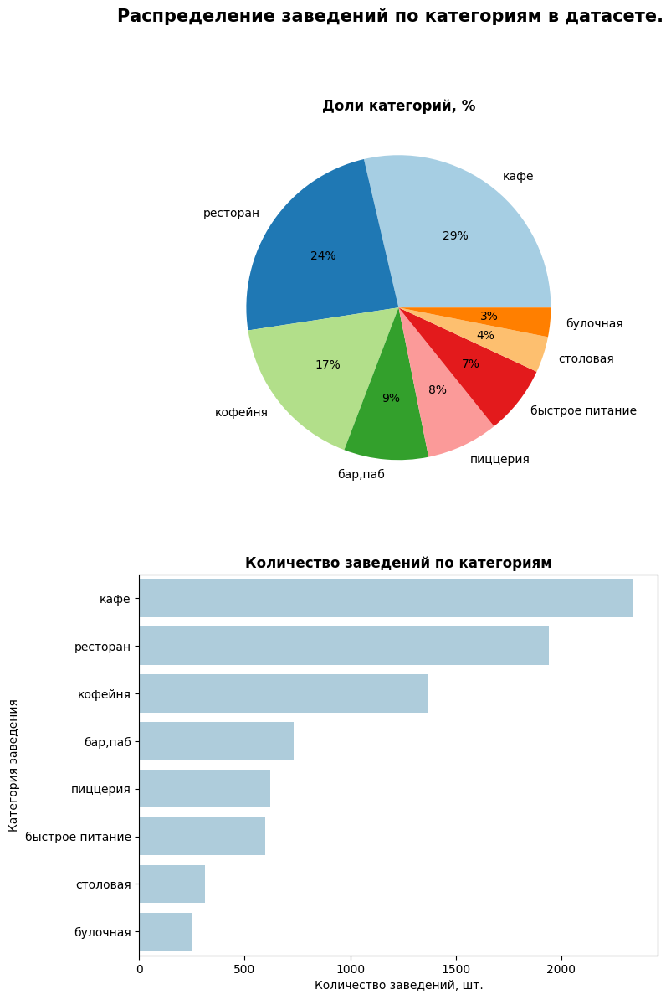

In [70]:
#задаем цвета для библиотеки seaborn
sns.set_palette("Set2")
sns.set_palette("Paired")

#создаем таблицу для графика с долями каждой категории
category_df = data['category'].value_counts().reset_index()
category_df.columns = ['categories', 'frequency']

#создание и офрмление графиков из получившихся выше таблиц и вывод их на экран в ряд
fig, axes= plt.subplots(2, 1)
fig.set_size_inches(8, 13)

fig.suptitle('Распределение заведений по категориям в датасете.',fontweight='bold',fontsize='15')

ax = axes[0]
ax.pie(data['category'].value_counts(),autopct='%.0f%%', labels=data['category'].value_counts().index)
ax.set_title('Доли категорий, %',fontweight='bold')

ax = axes[1]
ax = sns.barplot(x = 'frequency', y = 'categories', data = category_df)
axes[1].set_xlabel('Количество заведений, шт.')
axes[1].set_ylabel('Категория заведения')
ax.set_title('Количество заведений по категориям',fontweight='bold')

plt.show();

**Наблюдения**

* Чаще всего встречаются `кафе` — 2378 шт.
* Реже всего встречаются `булочные` — 255 шт.
* Бо́льшую часть рынка занимают три категории — `кафе`, `рестораны` и `кофейни` (69% от всех данных)

#### Количество посадочных мест по категориям

Сгруппируем таблицу по категориям и посчитаем медиану количества посадочных мест для каждой категории.

In [19]:
data.query('seats >= 0').groupby(by=["category"])["seats"].median().sort_values(ascending=False)

category
бар,паб            80.0
ресторан           80.0
кофейня            75.0
столовая           75.0
быстрое питание    64.5
кафе               60.0
пиццерия           52.0
булочная           49.0
Name: seats, dtype: float64

Дополнительно визуализируем распределения значений на диаграммах размаха:

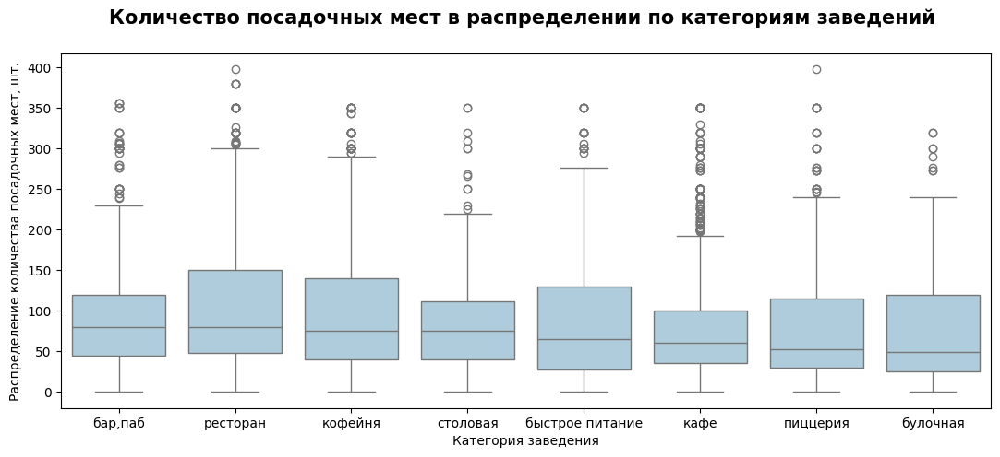

In [76]:
#создание порядка сортировки по медиане
my_order = data.query('seats >= 0').groupby(by=["category"])["seats"].median().sort_values(ascending=False).index

#создаем график
plt.figure(figsize=(13, 5))
sns.boxplot(data=data.query('seats >= 0'), x="category", y="seats", order=my_order)

#прописываем оси и названия
plt.title('Количество посадочных мест в распределении по категориям заведений \n',fontweight='bold',fontsize='15')
plt.xlabel('Категория заведения') 
plt.ylabel('Распределение количества посадочных мест, шт.');

**Наблюдения**

* Больше всего сидячих мест в барах(пабах) и ресторанах
* Меньше всего — в булочных

#### Соотношение сетевых и несетевых заведений

Напомним, что информация, является ли заведение сетевым, находится в столбце `chain`, содержащим булев тип данных:

 - False — заведение не является сетевым
 - True — заведение является сетевым

Узнаем соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [21]:
#выведем на экран соотношение в процентах
data['chain'].value_counts(normalize=True)*100

chain
False    61.674009
True     38.325991
Name: proportion, dtype: float64

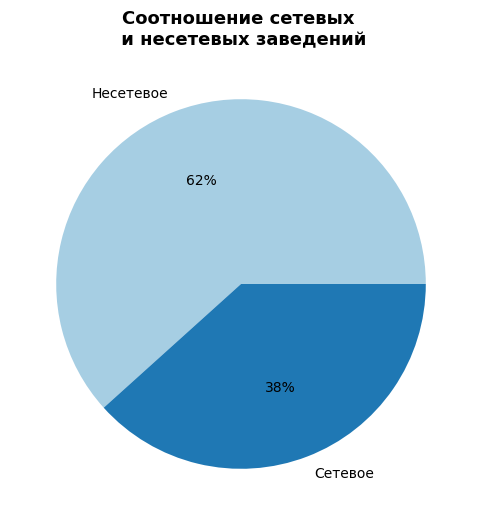

In [22]:
#визуализируем на графике
fig, ax = plt.subplots(figsize=(13, 6))

plt.title('Соотношение сетевых \n и несетевых заведений',fontweight='bold',fontsize='13')
plt.pie(data['chain'].value_counts(),autopct='%.0f%%', labels=['Несетевое','Сетевое']);

**Наблюдения**

Несетевых заведений больше (62% несетевых и 38% сетевых)

#### Соотношение сетевых и несетевых заведений с делением по категориям

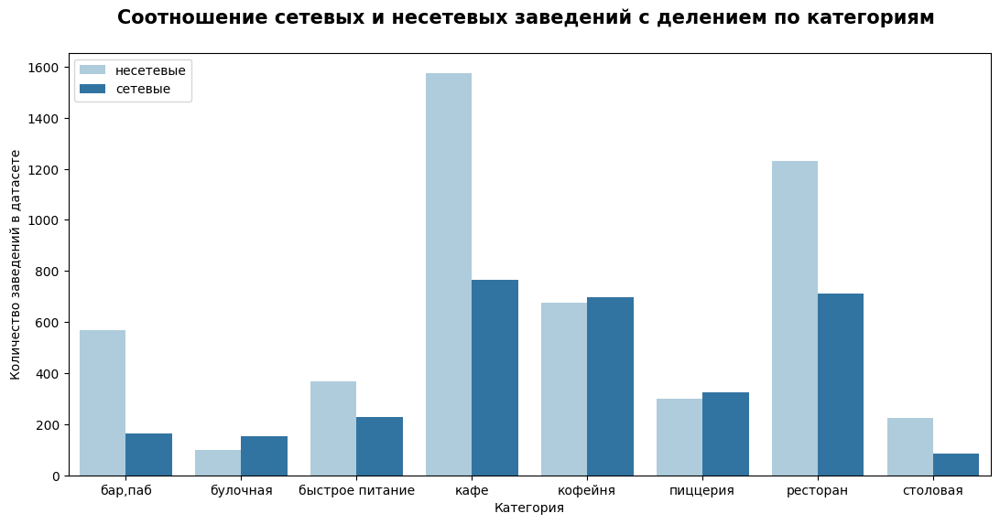

In [23]:
#создаем сводную таблицу с группировкой по дням и группам, считаем события для каждой категории
pivot_data = data.pivot_table(index=['category','chain'],
                           #   columns='chain',
                     values='name',
                     aggfunc=['count']).reset_index()

pivot_data.columns = ['category','chain','event_count']#присваиваем новой таблице названия столбцов

#строим график
fig, ax = plt.subplots(figsize=(13, 6))
sns.barplot(data=pivot_data, x='category', y='event_count', hue='chain', ci=None)

#прописываем оси и названия
plt.title('Соотношение сетевых и несетевых заведений с делением по категориям \n',fontweight='bold',fontsize='15')
plt.xlabel('Категория') 
plt.ylabel('Количество заведений в датасете')
plt.legend(loc='upper left', labels=['несетевые', 'сетевые']);

**Наблюдения**

* В кафе и ресторанах подавляющее большинство — несетевые заведения.
* Булочные, кофейни и пиццерии чуть более часто являются сетевыми.

#### Топ-15 популярных сетей в Москве

In [24]:
#сгруппируем данные по названиям заведений и посмотрим топ 25
top_names = data['name'].value_counts().head(25)
top_names

name
кафе                                   188
шоколадница                            111
домино'с пицца                          77
додо пицца                              73
one price coffee                        71
яндекс лавка                            68
cofix                                   64
prime                                   48
хинкальная                              44
шаурма                                  43
кофепорт                                42
теремок                                 38
кулинарная лавка братьев караваевых     38
чайхана                                 36
ресторан                                33
буханка                                 32
cofefest                                32
столовая                                28
му-му                                   26
drive café                              24
кофемания                               22
андерсон                                22
крошка картошка                         21
скалка

Часть названий, например `кафе` `хинкальная` `шаурма` сами по себе являются подкатегориями. Удалим их из рейтинга.

In [25]:
#удаляем названия-подкатегории
top_names = top_names.drop(['кафе','хинкальная','шаурма','чайхана','ресторан','столовая'])

In [26]:
#выводим оставшиеся названия на экран, сократив рейтинг до топ-15
top_15_names = top_names[:15]
top_15_names

name
шоколадница                            111
домино'с пицца                          77
додо пицца                              73
one price coffee                        71
яндекс лавка                            68
cofix                                   64
prime                                   48
кофепорт                                42
теремок                                 38
кулинарная лавка братьев караваевых     38
буханка                                 32
cofefest                                32
му-му                                   26
drive café                              24
кофемания                               22
Name: count, dtype: int64

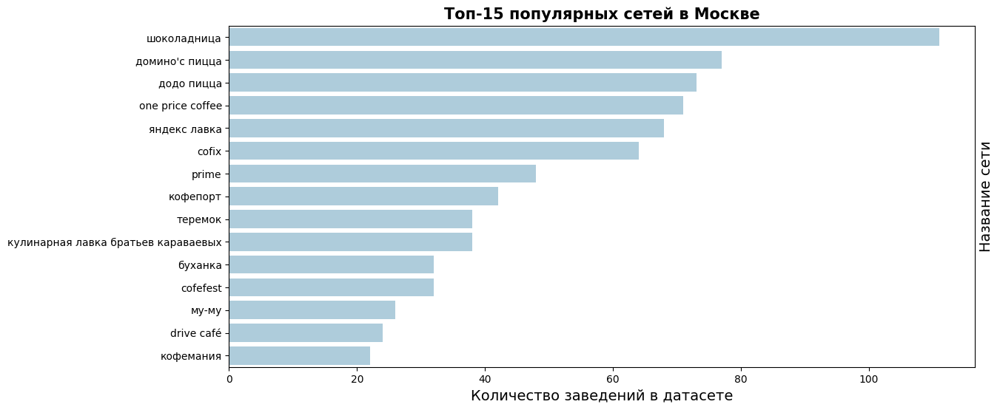

In [27]:
#строим график
fig, ax = plt.subplots(figsize=(13, 6))
sns.barplot(y=top_15_names.index, x=top_15_names.values)

#прописываем оси и названия
plt.title('Топ-15 популярных сетей в Москве',fontweight='bold',fontsize='15')
plt.xlabel('Количество заведений в датасете',fontsize='14') 
plt.ylabel('Название сети',fontsize='14')
ax.yaxis.set_label_position("right")


**Наблюдения**

Большинство заведений — широко известные сети пиццерий и кофеен.
В топе много заведений, ориентированных на невысокий средний чек и большую проходимость.

Уточним категории заведений в топ-15.

In [28]:
#создадим таблицу с топ 15 заведений и их категорией
top_15_categories = data.query('name in @top_15_names.index')[['name','category']]
top_15_categories = top_15_categories.drop_duplicates(subset=['name'], keep='first').reset_index(drop=True)
top_15_categories['category'].value_counts()

category
кофейня     6
кафе        3
ресторан    3
пиццерия    2
булочная    1
Name: count, dtype: int64

**Наблюдение**

Большинство заведений в топ-15 популярных сетей в Москве принадлежат к категориям `кофейня` или `кафе`

#### Распределение по районам Москвы

In [29]:
#посчитаем количество заведений в каждом районе
data['district'].value_counts()

district
Центральный административный округ         2139
Северо-Восточный административный округ     880
Южный административный округ                872
Северный административный округ             864
Западный административный округ             811
Восточный административный округ            784
Юго-Восточный административный округ        710
Юго-Западный административный округ         703
Северо-Западный административный округ      409
Name: count, dtype: int64

**Наблюдение**

* Больше всего заведений в ЦАО
* Меньше всего — в СЗАО

---

Посмотрим распределение заведений каждой категории по районам: 

In [30]:
#создаем сводную таблицу с группировкой по районам и категориям, считаем события для каждой подкатегории
district_pivot_data = data.pivot_table(index=['district','category'],
                           #   columns='chain',
                     values='name',
                     aggfunc=['count']).reset_index()
district_pivot_data.columns = ['district','category','count']#присваиваем новой таблице названия столбцов

district_pivot_data

,district,category,count
0,Восточный административный округ,"бар,паб",48
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,69
3,Восточный административный округ,кафе,269
4,Восточный административный округ,кофейня,103
...,...,...,...
67,Южный административный округ,кафе,262
68,Южный административный округ,кофейня,130
69,Южный административный округ,пиццерия,71
70,Южный административный округ,ресторан,192


Визуализируем доли каждой категории для округов на графике

In [31]:
#создаем сортировку для графика в порядке уменьшения общего количества заведений в округе
my_order = data['district'].value_counts().index.str.replace('административный округ','')

#удаляем из значений в столбце окончание '... административный округ'
district_pivot_data['district'] = district_pivot_data['district'].str.replace('административный округ','')

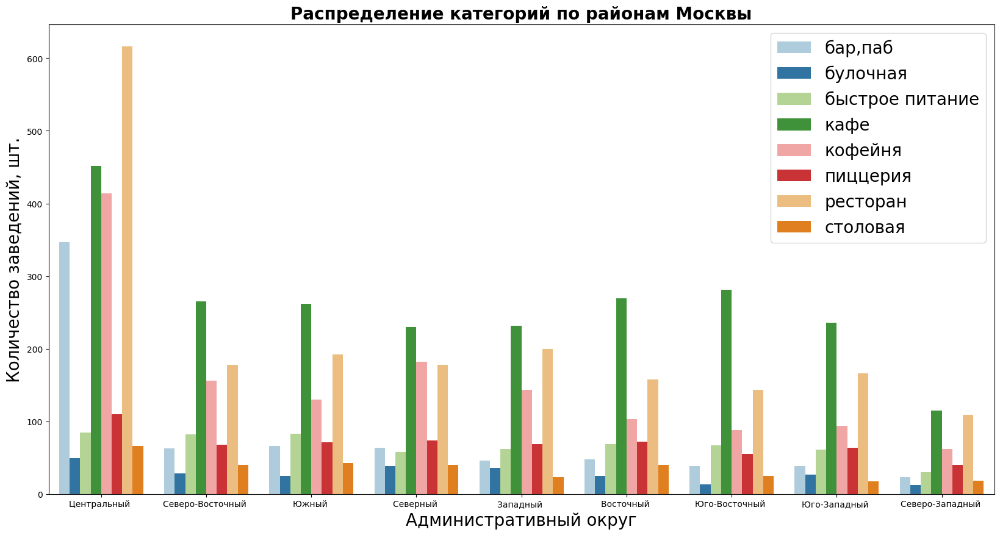

In [32]:
#строим график
sns.set_palette("Paired")

fig, ax = plt.subplots(figsize=(20, 10))
sns.barplot(data=district_pivot_data,x='district', y='count', hue='category', ci=None,order=my_order)
plt.tick_params(labelsize=10)

#прописываем оси и названия
plt.title('Распределение категорий по районам Москвы',fontweight='bold',fontsize='20')
plt.xlabel('Административный округ',fontsize='20') 
plt.ylabel('Количество заведений, шт.',fontsize='20')

plt.legend(loc="upper right", frameon=True, fontsize=20)


**Наблюдения**

* В подавляющем большинстве округов больше всего доля кафе, а на втором месте — рестораны.
* В ЦАО рестораны выходят на первое место, также высока доля баров.

####  Средние рейтинги в зависимости от  категорий заведений

In [33]:
categories_rating_medians = data.groupby(by='category')['rating'].median().sort_values(ascending=False)
categories_rating_medians

category
бар,паб            4.4
булочная           4.3
кофейня            4.3
пиццерия           4.3
ресторан           4.3
столовая           4.3
быстрое питание    4.2
кафе               4.2
Name: rating, dtype: float64

**Средний рейтинг** для всех категорий заведений примерно одинаков **4.2-4.4**

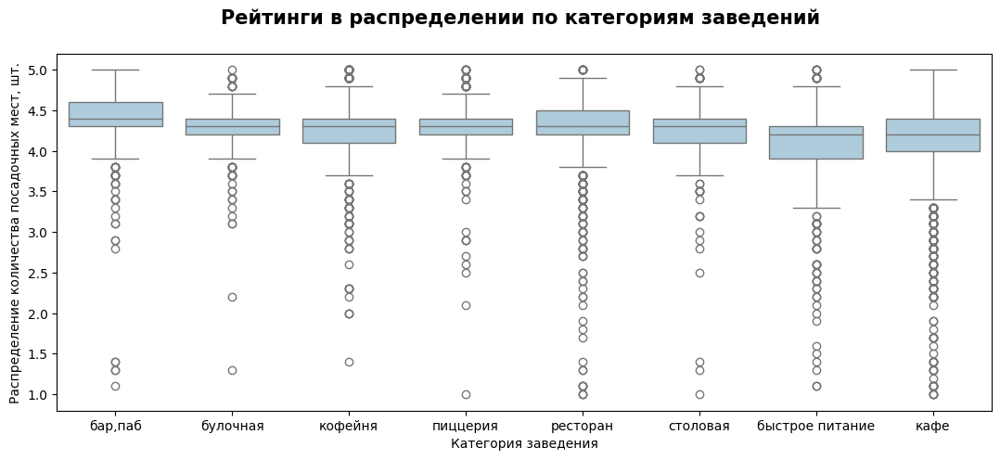

In [34]:
#создание порядка сортировки по медиане
my_order = data.groupby(by=["category"])["rating"].median().sort_values(ascending=False).index

#создаем график
plt.figure(figsize=(13, 5))
sns.boxplot(data=data, x="category", y="rating", order=my_order)

#прописываем оси и названия
plt.title('Рейтинги в распределении по категориям заведений \n',fontweight='bold',fontsize='15')
plt.xlabel('Категория заведения') 
plt.ylabel('Распределение количества посадочных мест, шт.');

Из-за множественных выбросов ящики видно не очень хорошо, приблизим график, ограничив ось Y

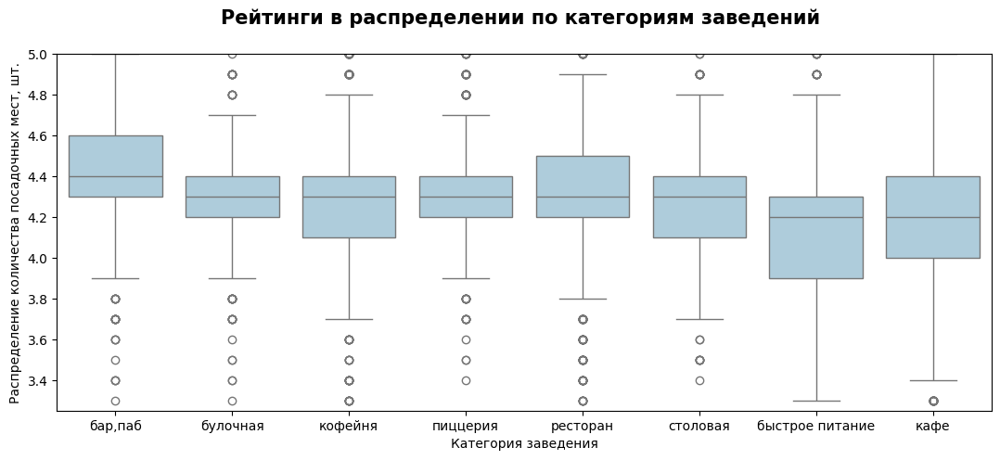

In [35]:
#создание порядка сортировки по медиане
my_order = data.groupby(by=["category"])["rating"].median().sort_values(ascending=False).index

#создаем график
plt.figure(figsize=(13, 5))
sns.boxplot(data=data, x="category", y="rating", order=my_order)
plt.ylim(3.25, 5)

#прописываем оси и названия
plt.title('Рейтинги в распределении по категориям заведений \n',fontweight='bold',fontsize='15')
plt.xlabel('Категория заведения') 
plt.ylabel('Распределение количества посадочных мест, шт.');

**Наблюдения**

Усреднённые рейтинги в разных типах общепита почти не отличаются **(4.2-4.4)**

#### Картограмма средних рейтингов заведений

In [36]:
#создаем таблицу со средним рейтингом заведений в каждом округе
rating_df = data.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating',ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


Усреднённые рейтинги по округам тоже практически одинаковые

Границы районов Москвы хранятся в файле `admin_level_geomap.geojson`

In [37]:
# читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Наблюдения**

* Усреднённые рейтинги по округам тоже практически одинаковы **(4.2-4.4)**
* Лучшие средние рейтинги в Центральном округе, а худшие — в Северо-Восточном и Юго-Восточном

#### Заведения на карте

Отобразим заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [38]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

**Наблюдения**

* Большая часть заведений находятся в пределах МКАД, в датасет не вошли Зеленоградский, Троицкий и Новомосковский округа.

####  Топ-15 улиц по количеству заведений

In [39]:
#группируем улицы по количеству заведений и выводим топ-15
data['street'].value_counts().head(15)

street
проспект мира             182
профсоюзная улица         122
ленинский проспект        100
проспект вернадского       96
дмитровское шоссе          87
каширское шоссе            76
варшавское шоссе           76
ленинградский проспект     67
ленинградское шоссе        67
мкад                       65
люблинская улица           60
улица вавилова             53
пятницкая улица            48
алтуфьевское шоссе         47
кутузовский проспект       47
Name: count, dtype: int64

Уточним, какую долю заведения на Проспекте Мира занимают от общего количества заведений:

In [40]:
print(round(data['street'].value_counts().head(1)[0]/data.shape[0]*100,2),'%')

2.23 %


Построим график распределения категорий заведений в топ-15 улиц.

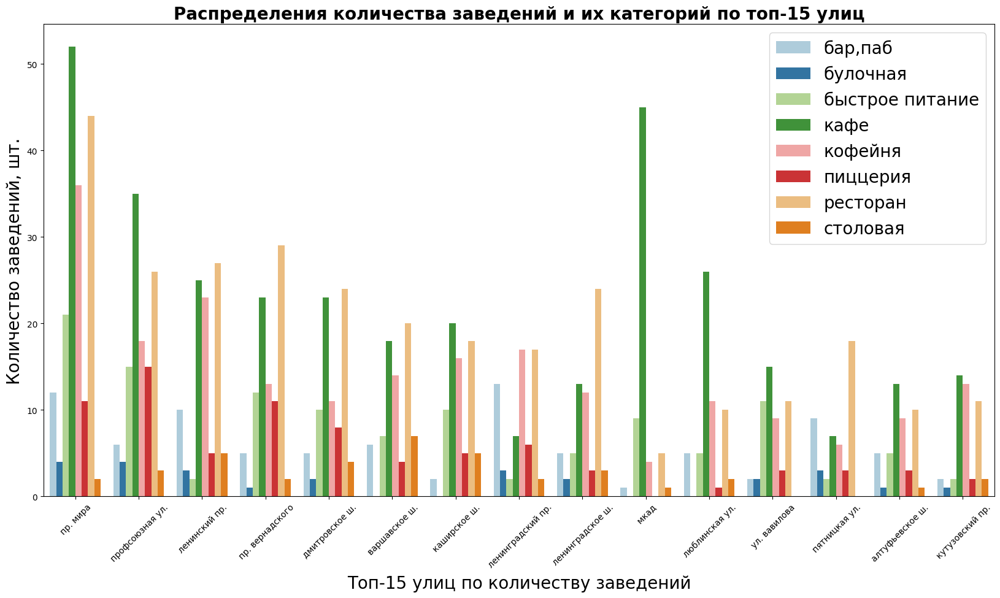

In [78]:
#создаем список названий в топе-15
top15_streets = data['street'].value_counts().head(15).index
#делаем срез данных с фильтрацией по этопу списку
data_slice_top15_streets = data.query('street in @top15_streets')

#создаем сводную таблицу с группировкой по улице из списка и категориям, считаем события для каждой подкатегории
pivot_data = data_slice_top15_streets.pivot_table(index=['street','category'],
                     values='name',
                     aggfunc=['count']).reset_index()
pivot_data.columns = ['street','category','count']#присваиваем новой таблице названия столбцов

pivot_data['street'] = pivot_data['street'].str.replace('шоссе','ш.')
pivot_data['street'] = pivot_data['street'].str.replace('улица','ул.')
pivot_data['street'] = pivot_data['street'].str.replace('проспект','пр.')

#создаем сортировку для графика в порядке уменьшения общего количества заведений на улице
my_order = pivot_data.groupby('street')['count'].sum().sort_values(ascending=False).index

#строим график
fig, ax = plt.subplots(figsize=(20, 10))
sns.barplot(data=pivot_data,x='street', y='count', hue='category', ci=None, order=my_order)
plt.tick_params(labelsize=10)
plt.xticks(rotation=45)

#прописываем оси и названия
plt.title('Распределения количества заведений и их категорий по топ-15 улиц',fontweight='bold',fontsize='20')
plt.xlabel('Топ-15 улиц по количеству заведений',fontsize='20') 
plt.ylabel('Количество заведений, шт.',fontsize='20')

plt.legend(loc="upper right", frameon=True, fontsize=20);

**Наблюдения**

* Больше всего заведений находятся на проспектах, длинных улицах и шоссе.
* На улице Проспект Мира находится 2,23% от общего количества заведений в датасете.
* На МКАД преобладают кафе, видимо это самый удобный вариант для автомобилистов и совсем нет булочных
* Есть ряд улиц, в которых преобладает доля ресторанов, например — Проспект вернадского, Дмитровское шоссе, Ленинградское шоссе.

####  Улицы с малым количеством заведений

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [43]:
#создаем список улиц с только одним заведением
only_1_place = data['street'].value_counts() == 1
only_1_place = only_1_place.to_frame().reset_index()

only_1_place_list = only_1_place.query('count == True')['street'].tolist()

#делаем срез данных по эти улицам и записываем в переменную
data_slice__streets = data.query('street in @only_1_place_list')

#выясним долю таких улиц
print('Количество улиц с одним заведением:',len(only_1_place_list))
print('Доля заведений на этих улицах от общего количества заведений в датасете:',
      round(len(only_1_place_list)/data.shape[0]*100,2),'%')
print('Доля этих улиц от общего количества улиц в датасете:',
      round(len(only_1_place_list)/len(data['street'].unique())*100,2),'%')

Количество улиц с одним заведением: 453
Доля заведений на этих улицах от общего количества заведений в датасете: 5.54 %
Доля этих улиц от общего количества улиц в датасете: 31.5 %


Для следующих категорий сравним доли категорий в столбце между общим датасетом и новым:
* `category`
* `district`
* `rating`
* `price`
* `middle_avg_bill`
* `middle_coffee_cup`
* `chain`
* `seats`
* `is_24_7`

In [79]:
#для столбцов, содержащих категориальные данные применим метод value_counts()
cat_list = ['category', 'district', 'chain', 'price', 'is_24_7']

#cat_list = ['category', 'district', 'rating', 'price', 'middle_avg_bill', 'middle_coffee_cup', 'chain', 'seats', 'is_24_7']
for column in cat_list:
    print('\033[1m Сравнение долей в % по столбцу',column,'\033[0m ')
    #создаем сводную таблицу с группировкой по годам
    data_slice1 = data_slice__streets[column].value_counts(normalize=True).head(10).to_frame()*100

    #создаем сводную таблицу с группировкой по месяцам
    data_slice2 = data[column].value_counts(normalize=True).head(10).to_frame()*100

    #выведем обе таблицы на экран
    df1_styler = data_slice1.style.set_table_attributes("style='display:inline'").set_caption('<b>Улицы с 1-м заведением</b>')
    df2_styler = data_slice2.style.set_table_attributes("style='display:inline'").set_caption('<b>Весь датасет</b>')
    display_html(df1_styler._repr_html_()+15*'&nbsp'+df2_styler._repr_html_(), raw=True)
    print()

 Сравнение долей в % по столбцу category  


,proportion
category,
кафе,35.320088
ресторан,19.205298
кофейня,18.984547
"бар,паб",8.388521
столовая,7.947020
быстрое питание,5.077263
пиццерия,3.311258
булочная,1.766004
,proportion



 Сравнение долей в % по столбцу district  


,proportion
district,
Центральный административный округ,31.125828
Северо-Восточный административный округ,12.141280
Восточный административный округ,11.479029
Северный административный округ,11.258278
Южный административный округ,9.271523
Юго-Восточный административный округ,8.830022
Западный административный округ,7.726269
Северо-Западный административный округ,4.194260
Юго-Западный административный округ,3.973510



 Сравнение долей в % по столбцу chain  


,proportion
chain,
False,69.977925
True,30.022075
,proportion
chain,
False,61.674009
True,38.325991



 Сравнение долей в % по столбцу price  


,proportion
price,
unknown,61.368653
средние,26.490066
выше среднего,6.181015
высокие,3.532009
низкие,2.428256
,proportion
price,
unknown,61.257954
средние,25.379344



 Сравнение долей в % по столбцу is_24_7  


,proportion
is_24_7,
False,93.156733
True,6.843267
,proportion
is_24_7,
False,91.177190
True,8.822810


In [45]:
#для столбцов, содержащих числовые данные применим метод describe()
cat_list = ['rating','middle_avg_bill', 'middle_coffee_cup', 'seats']

for column in cat_list:
    print('\033[1m Сравнение долей в % по столбцу',column,'\033[0m ')
    
    data_slice1 = data_slice__streets[column].describe().to_frame()

    data_slice2 = data[column].describe().to_frame()
    
    data_slice1 = data_slice1.loc[data_slice1[column] >= 0]
    data_slice2 = data_slice2.loc[data_slice2[column] >= 0]

    #выведем обе таблицы на экран
    df1_styler = data_slice1.style.set_table_attributes("style='display:inline'").set_caption('<b>Улицы с 1-м заведением</b>')
    df2_styler = data_slice2.style.set_table_attributes("style='display:inline'").set_caption('<b>Весь датасет</b>')
    display_html(df1_styler._repr_html_()+15*'&nbsp'+df2_styler._repr_html_(), raw=True)
    print()

 Сравнение долей в % по столбцу rating  


,rating
count,453.000000
mean,4.234658
std,0.459814
min,1.000000
25%,4.100000
50%,4.300000
75%,4.500000
max,5.000000
,rating
count,8172.000000



 Сравнение долей в % по столбцу middle_avg_bill  


,middle_avg_bill
count,453.000000
mean,281.741722
std,519.589360
75%,350.000000
max,2750.000000
,middle_avg_bill
count,8172.000000
mean,316.908835
std,552.439080
75%,425.000000



 Сравнение долей в % по столбцу middle_coffee_cup  


,middle_coffee_cup
count,453.000000
mean,8.152318
std,40.905148
max,275.000000
,middle_coffee_cup
count,8172.000000
mean,9.402961
std,43.254649
max,279.000000



 Сравнение долей в % по столбцу seats  


,seats
count,453.000000
mean,18.520971
std,39.420387
75%,30.000000
max,240.000000
,seats
count,8172.000000
mean,52.260768
std,76.146138
50%,18.500000


**Наблюдения**

Мы изучили особенности улиц с малым количеством заведений и выделили следующие:

* Количество улиц с одним заведением: 453
* Доля заведений на этих улицах от общего количества заведений в датасете: 5.54 %
* Доля таких улиц от общего количества улиц: 31.5 %
* Для таких улиц характерно:
     * бóльшая доля кафе;
     * такие улицы чаще расположены в ЦАО;
     * реже обладают высокой категорией цен;
     * чаще встречаются несетевые заведения.

#### Картограмма средних чеков заведений

In [46]:
#посчитаем медиану этого столбца для каждого района. 
avg_bill_df = data.query('middle_avg_bill >= 0').groupby('district', as_index=False)['middle_avg_bill'].agg('median')
avg_bill_df.sort_values(by='middle_avg_bill',ascending=False)

,district,middle_avg_bill
5,Центральный административный округ,1000.0
1,Западный административный округ,850.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,640.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,525.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,439.0


In [47]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# выводим карту
m

**Наблюдения**

* Самый высокий средний чек в **ЦАО — 1000**, за ним следует **ЗАО — 850**
* Самый низкий средний чек в **ЮВАО — 439.0**
* Чтобы точнее выяснить, как удалённость от центра влияет на цены в заведениях, следует более дробно посмотреть деление среднего чека. По районам Москвы, а не округам.

####  Особенности заведений с плохими рейтингами

Посмотрим распределение значений в столбце `rating`:

In [48]:
data['rating'].describe()

count    8172.000000
mean        4.226982
std         0.472756
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

25% значений находятся ниже рейтинга 4.1
Возьмем значение 4 за порог плохого рейтинга.

In [49]:
#сохраним срез данных заведений с рейтингом ниже 4 в переменную
bad_ratings = data.query('rating < 4')

#узначем количетсво таких заведений
print('Количество заведений с рейтингом менее 4:',bad_ratings.shape[0])

print('Доля заведений с низким рейтингом от общего количества заведений в датасете:',
      round(bad_ratings.shape[0]/data.shape[0]*100,2),'%')

Количество заведений с рейтингом менее 4: 1155
Доля заведений с низким рейтингом от общего количества заведений в датасете: 14.13 %


Для следующих категорий сравним категорий в столбце между общим датасетом и заведениями с **рейтингом менее 4**:
* `category`
* `district`
* `price`
* `middle_avg_bill`
* `middle_coffee_cup`
* `chain`
* `seats`
* `is_24_7`

In [50]:
#для столбцов, содержащих категориальные данные применим метод value_counts()
cat_list = ['category', 'district', 'chain', 'price', 'is_24_7']

for column in cat_list:
    print('\033[1m Сравнение долей в % по столбцу',column,'\033[0m ')
    #создаем сводную таблицу с группировкой по годам
    data_slice1 = bad_ratings[column].value_counts(normalize=True).head(10).to_frame()*100

    
    #создаем сводную таблицу с группировкой по месяцам
    data_slice2 = data[column].value_counts(normalize=True).head(10).to_frame()*100


    #выведем обе таблицы на экран
    df1_styler = data_slice1.style.set_table_attributes("style='display:inline'").set_caption('<b>Заведения с рейтингом < 4</b>')
    df2_styler = data_slice2.style.set_table_attributes("style='display:inline'").set_caption('<b>Весь датасет</b>')
    display_html(df1_styler._repr_html_()+15*'&nbsp'+df2_styler._repr_html_(), raw=True)
    print()

 Сравнение долей в % по столбцу category  


,proportion
category,
кафе,46.493506
ресторан,15.064935
быстрое питание,13.939394
кофейня,11.861472
столовая,3.809524
"бар,паб",3.290043
пиццерия,2.943723
булочная,2.597403
,proportion



 Сравнение долей в % по столбцу district  


,proportion
district,
Юго-Восточный административный округ,14.718615
Южный административный округ,13.073593
Северо-Восточный административный округ,12.900433
Восточный административный округ,12.640693
Западный административный округ,11.861472
Северный административный округ,10.476190
Юго-Западный административный округ,10.216450
Центральный административный округ,9.004329
Северо-Западный административный округ,5.108225



 Сравнение долей в % по столбцу chain  


,proportion
chain,
False,65.974026
True,34.025974
,proportion
chain,
False,61.674009
True,38.325991



 Сравнение долей в % по столбцу price  


,proportion
price,
unknown,84.329004
средние,11.515152
низкие,2.510823
выше среднего,1.038961
высокие,0.606061
,proportion
price,
unknown,61.257954
средние,25.379344



 Сравнение долей в % по столбцу is_24_7  


,proportion
is_24_7,
False,84.675325
True,15.324675
,proportion
is_24_7,
False,91.177190
True,8.822810


In [51]:
#для столбцов, содержащих числовые данные применим метод describe()
cat_list = ['middle_avg_bill', 'middle_coffee_cup', 'seats']

for column in cat_list:
    print('\033[1m Сравнение долей в % по столбцу',column,'\033[0m ')

    data_slice1 = bad_ratings[column].describe().to_frame()

    data_slice2 = data[column].describe().to_frame()

    data_slice1 = data_slice1.loc[data_slice1[column] >= 0]
    data_slice2 = data_slice2.loc[data_slice2[column] >= 0]

    #выведем обе таблицы на экран
    df1_styler = data_slice1.style.set_table_attributes("style='display:inline'").set_caption('<b>Заведения с рейтингом < 4</b>')
    df2_styler = data_slice2.style.set_table_attributes("style='display:inline'").set_caption('<b>Весь датасет</b>')
    display_html(df1_styler._repr_html_()+15*'&nbsp'+df2_styler._repr_html_(), raw=True)
    print()

 Сравнение долей в % по столбцу middle_avg_bill  


,middle_avg_bill
count,1155.000000
mean,104.546320
std,287.551982
max,2750.000000
,middle_avg_bill
count,8172.000000
mean,316.908835
std,552.439080
75%,425.000000
max,2900.000000



 Сравнение долей в % по столбцу middle_coffee_cup  


,middle_coffee_cup
count,1155.000000
mean,2.261472
std,22.193591
max,270.000000
,middle_coffee_cup
count,8172.000000
mean,9.402961
std,43.254649
max,279.000000



 Сравнение долей в % по столбцу seats  


,seats
count,1155.000000
mean,43.878788
std,71.893293
50%,0.000000
75%,60.000000
max,350.000000
,seats
count,8172.000000
mean,52.260768
std,76.146138


**Наблюдения**

Мы изучили особенности заведений с низким рейтингом и выделили следующие закономерности:

* Количество заведений с рейтингом менее 4: 1155.
* Доля заведений с низким рейтингом от общего количества заведений: 14.13%.
* Для таких заведений характерны:
 * больше кафе, ресторанов быстрого питания и меньше ресторанов
 * гораздо меньше заведений находятся в ЦАО
 * выше доля заведений с низкими ценами, средним чеком и ценой за чашку капучино
 * меньше посадочных мест


####  Промежуточный вывод

**Мы анализ рынка общественного питания Москвы и выяснили следующие закономерности:**

---

**Категории заведений**

* **Бо́льшую часть рынка занимают три категории — кафе, рестораны и кофейни** (69% от всех данных), их них чаще всего встречаются кафе — 2378 шт.

* Больше всего сидячих мест в барах(пабах) и ресторанах
* Несетевых заведений больше (62% несетевых и 38% сетевых), при этом **кафе и рестораны в подавляющем большинстве — несетевые заведения**, а для булочных, кофеен и пиццерий характерно входить в сеть.
* Самые крупные сети в Москве — широко известные сети пиццерий и кофеен. **Большинство заведений в топ-15 популярных сетей в Москве — кофейни**
**Рейтинги**
* **Усреднённые рейтинги** как с делением по разным типам общепита, так и с делением по округам **почти не отличаются** **(4.2-4.4)**
* **Лучшие рейтинги в среднем в Центральном округе**, а худшие — в Северо-Восточном и Юго-Восточном

--- 

**Районы Москвы**

* Большая часть заведений находятся в пределах МКАД, в датасет не вошли Зеленоградский, Троицкий и Новомосковский округа.
* В подавляющем большинстве округов больше всего доля кафе, с ресторанами на втором месте.
* В ЦАО рестораны выходят на первое место, также высока доля баров
* Больше всего заведений находятся на проспектах, длинных улицах и шоссе, например на Проспекте Мира находятся 2.23% от общего количества заведений в датасете.
* На МКАД преобладают кафе, видимо это самый удобный вариант для автомобилистов и совсем нет булочных
* 31.5% — улицы со всего одним заведением, для них характерны:
     * большая доля кафе
     * такие улицы чаще расположены в ЦАО
     * реже обладают высокой категорией цен
     * чаще встречаются несетевые заведения
* **Самый высокий средний чек в ЦАО — 1000**

---

**Характеристики заведений с низким рейтингом**

Заведения с низким рейтингом составляют 14,13% от общего количества в датасете. Для них характерны следующие особенности:
* преобладание кафе и ресторанов быстрого питания при меньшем количестве ресторанов;
* меньшее количество таких заведений расположено в ЦАО;
* в основном это заведения с низкими ценами, средним чеком и невысокой ценой за чашку капучино;
* среднее количество посадочных мест в таких заведениях меньше.

### Детализация исследования: открытие кофейни

Наша цель — открыть кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно.

Чтобы оценить рынок кофеен, ответим на следующие вопросы:

####  Количество кофеен в датасете:

In [52]:
#создаем переменную cafes со всеми кофейнями в датасете
cafes = data.query('category == "кофейня"')
independent_cafes = data.query('category == "кофейня" and chain == False')

print('Количество кофеен в датасете:',cafes.shape[0])
print('Количество несетевых кофеен в датасете:',independent_cafes.shape[0])

Количество кофеен в датасете: 1372
Количество несетевых кофеен в датасете: 675


In [53]:
cafes['district'].value_counts(normalize=True)*100

district
Центральный административный округ         30.174927
Северный административный округ            13.265306
Северо-Восточный административный округ    11.370262
Западный административный округ            10.422741
Южный административный округ                9.475219
Восточный административный округ            7.507289
Юго-Западный административный округ         6.851312
Юго-Восточный административный округ        6.413994
Северо-Западный административный округ      4.518950
Name: proportion, dtype: float64

**Наблюдения**

* 30% кофеен находятся в ЦАО

---
Посмотрим на графике в каких округах находятся кофейни с делением по признаку (сетевое/несетевое):

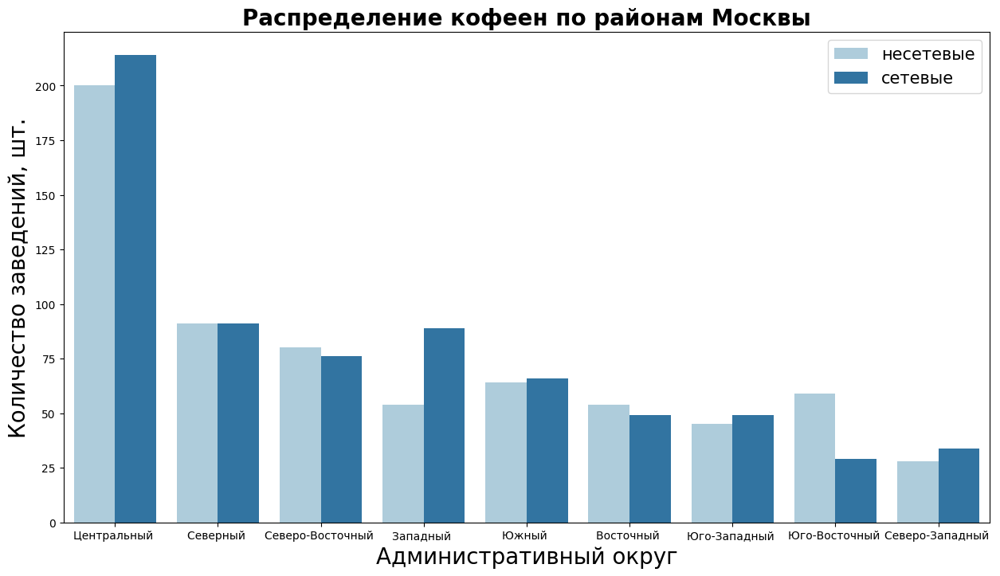

In [54]:
#создаем сводную таблицу с группировкой по районам и категориям, считаем события для каждой подкатегории
cafe_pivot_data = cafes.pivot_table(index=['district','chain'],
                           #   columns='chain',
                     values='name',
                     aggfunc=['count']).reset_index()
cafe_pivot_data.columns = ['district','chain','count']#присваиваем новой таблице названия столбцов

 #создаем сортировку для графика в порядке уменьшения общего количества заведений в округе
my_order = cafe_pivot_data.groupby('district')['count'].sum().sort_values(ascending=False).index.str.replace('административный округ','')

#удаляем из значений в столбце окончание '... административный округ'
cafe_pivot_data['district'] = cafe_pivot_data['district'].str.replace('административный округ','')

#создаем график
fig, ax = plt.subplots(figsize=(15, 8))
sns.barplot(data=cafe_pivot_data ,x='district', y='count', hue='chain', ci=None,order=my_order)
plt.tick_params(labelsize=10)

#прописываем оси и названия
plt.title('Распределение кофеен по районам Москвы',fontweight='bold',fontsize='20')
plt.xlabel('Административный округ',fontsize='20') 
plt.ylabel('Количество заведений, шт.',fontsize='20')

plt.legend(loc="upper right", frameon=True,fontsize=15, labels=['несетевые', 'сетевые']);

**Наблюдения**

* В датасете всего 1372 кофейни, при этом 675 из них — несетевые
* Большая часть кофеен **30%**  находятся в ЦАО, где преобладают сетевые кофейни

####  Круглосуточные кофейни

Посчитаем долю круглосуточных кофеен

In [55]:
cafes['is_24_7'].value_counts(normalize=True)*100

is_24_7
False    95.845481
True      4.154519
Name: proportion, dtype: float64

**Наблюдения**

Круглосуточные кофейни занимают всего 4% от всего датасета.

####  Рейтинги 

Узнаем, как рейтинги распределяются по районам?

In [56]:
cafes.groupby(by='district')['rating'].median().sort_values(ascending=False)

district
Восточный административный округ           4.3
Северный административный округ            4.3
Северо-Восточный административный округ    4.3
Северо-Западный административный округ     4.3
Центральный административный округ         4.3
Юго-Восточный административный округ       4.3
Юго-Западный административный округ        4.3
Южный административный округ               4.3
Западный административный округ            4.2
Name: rating, dtype: float64

**Наблюдения**

Особой разницы между рейтингами в распределении по районам нет

####  Стоимость чашки капучино

Посчитаем медианную стоимость чашки капучино с делением по округам:

In [57]:
cafes.query('middle_coffee_cup >= 0').groupby(by='district')['middle_coffee_cup'].median().sort_values(ascending=False)

district
Юго-Западный административный округ        197.0
Центральный административный округ         185.0
Западный административный округ            170.0
Северо-Западный административный округ     165.0
Северный административный округ            155.0
Северо-Восточный административный округ    155.0
Южный административный округ               150.0
Юго-Восточный административный округ       145.0
Восточный административный округ           135.0
Name: middle_coffee_cup, dtype: float64

**Посмотрим на графике усредненную стоимость чашки в округах**

,district,count
0,Восточный административный округ,135.0
1,Западный административный округ,170.0
2,Северный административный округ,155.0
3,Северо-Восточный административный округ,155.0
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,185.0
6,Юго-Восточный административный округ,145.0
7,Юго-Западный административный округ,197.0
8,Южный административный округ,150.0


Text(0, 0.5, 'Медиана стоимости')

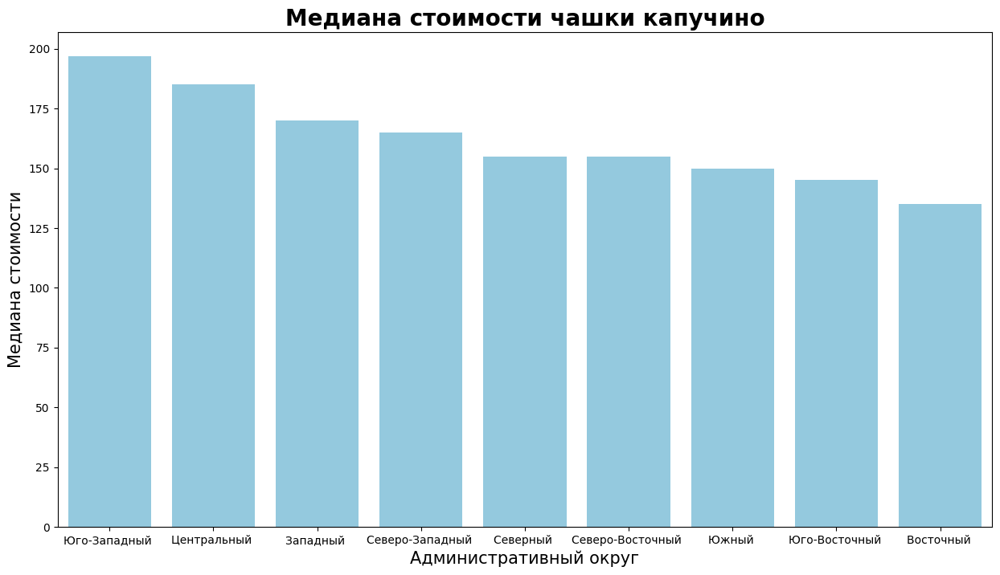

In [58]:
#создаем сводную таблицу с группировкой по районам и категориям, считаем события для каждой подкатегории
cafe_pivot_data = cafes.query('middle_coffee_cup >= 0').pivot_table(index=['district'],
                     values='middle_coffee_cup',
                     aggfunc=['median']).reset_index()
cafe_pivot_data.columns = ['district','count']#присваиваем новой таблице названия столбцов

display(cafe_pivot_data)

#создаем сортировку для графика в порядке уменьшения общего количества заведений в округе
my_order = my_order = cafe_pivot_data.groupby('district')['count'].sum().sort_values(ascending=False).index.str.replace('административный округ','')

#удаляем из значений в столбце окончание '... административный округ'
cafe_pivot_data['district'] = cafe_pivot_data['district'].str.replace('административный округ','')

#создаем график
fig, ax = plt.subplots(figsize=(15, 8))
sns.barplot(data=cafe_pivot_data,x='district', y='count', ci=None,order=my_order,color='skyblue')
plt.tick_params(labelsize=10)

#прописываем оси и названия
plt.title('Медиана стоимости чашки капучино',fontweight='bold',fontsize='20')
plt.xlabel('Административный округ',fontsize='15') 
plt.ylabel('Медиана стоимости',fontsize='15')

# plt.legend(loc="upper right", frameon=True,fontsize=15, labels=['несетевые', 'сетевые']);

**Посмотрим на графике усредненный средний чек в округах**

Text(0, 0.5, 'Медиана стоимости')

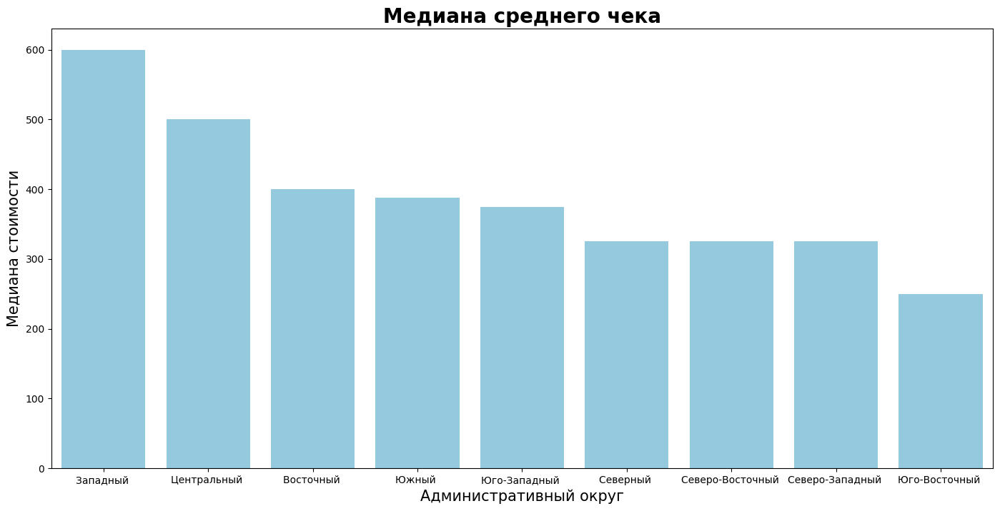

In [59]:
#создаем сводную таблицу с группировкой по районам и категориям, считаем события для каждой подкатегории
cafe_pivot_data = cafes.query('middle_avg_bill >= 0').pivot_table(index=['district'],
                           #   columns='chain',
                     values='middle_avg_bill',
                     aggfunc=['median']).reset_index()
cafe_pivot_data.columns = ['district','count']#присваиваем новой таблице названия столбцов

#создаем сортировку для графика в порядке уменьшения общего количества заведений в округе
my_order = cafe_pivot_data.groupby('district')['count'].sum().sort_values(ascending=False).index.str.replace('административный округ','')

#удаляем из значений в столбце окончание '... административный округ'
cafe_pivot_data['district'] = cafe_pivot_data['district'].str.replace('административный округ','')

#создаем график
fig, ax = plt.subplots(figsize=(17, 8))
sns.barplot(data=cafe_pivot_data,x='district', y='count', ci=None,order=my_order, color='skyblue')
plt.tick_params(labelsize=10)

#прописываем оси и названия
plt.title('Медиана среднего чека',fontweight='bold',fontsize='20')
plt.xlabel('Административный округ',fontsize='15') 
plt.ylabel('Медиана стоимости',fontsize='15')

# plt.legend(loc="upper right", frameon=True,fontsize=15, labels=['несетевые', 'сетевые']);

In [60]:
cafe_pivot_data.groupby(by='district')['count'].sum().sort_values()

district
Юго-Восточный        250.0
Северный             325.0
Северо-Восточный     325.0
Северо-Западный      325.0
Юго-Западный         375.0
Южный                387.5
Восточный            400.0
Центральный          500.0
Западный             600.0
Name: count, dtype: float64

**Наблюдения**

* Самое дорогое кофе в ЮЗАО
* Самое дешевое — в ВАО

####  Особенности кофеен с высоким рейтингом

Обратим внимание на особенности кофеен с высоким рейтингом — они могут дать представление о том, какие аспекты делают их успешными.

In [61]:
#уточним распределение рейтингов в датасете с кофейнями
cafes['rating'].describe()

count    1372.000000
mean        4.277114
std         0.376208
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

25% значений находятся выше рейтинга 4.4.\
Возьмем значение 4.5 за порог высокого рейтинга.

In [62]:
def categorize_rating(row):
    if row['rating'] >= 4.5:
        return 'высокий'
    elif 4 <= row['rating'] < 4.5:
        return 'средний'
    elif row['rating'] < 4:
        return 'низкий'
    
cafes['rating_category'] = data.apply(categorize_rating, axis=1)

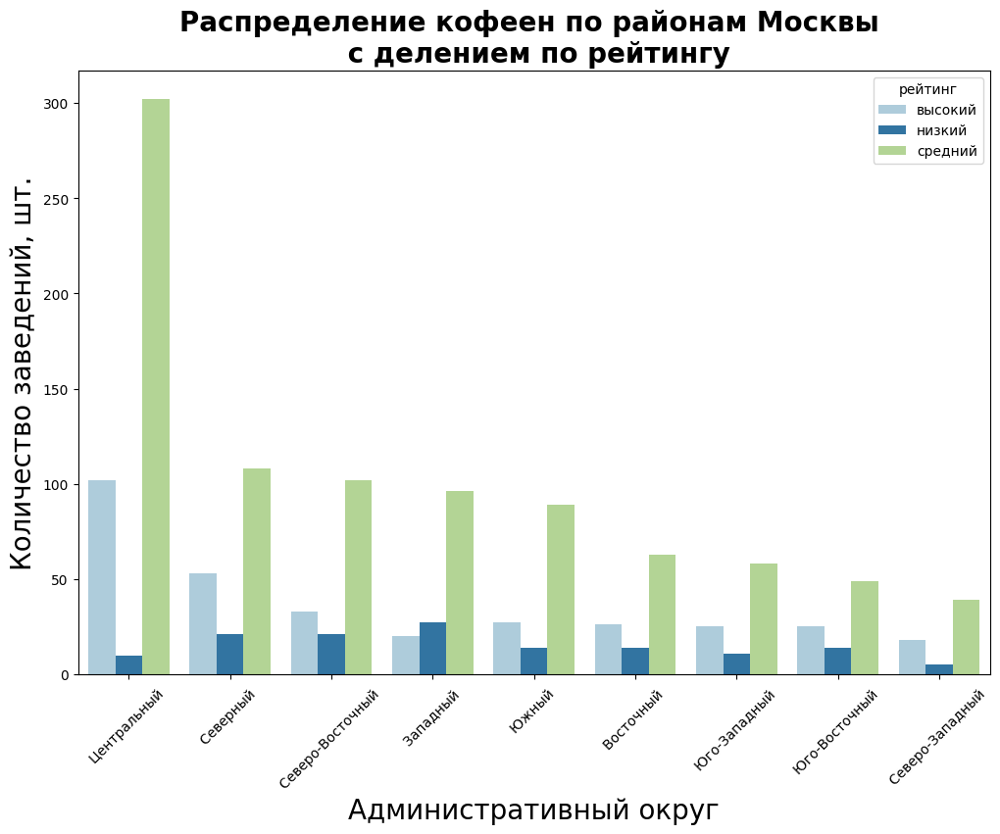

In [63]:
#создаем сводную таблицу с группировкой по районам и рейтингам, считаем события для каждой подкатегории
cafe_pivot_data = cafes.pivot_table(index=['district','rating_category'],
                           #   columns='chain',
                     values='name',
                     aggfunc=['count']).reset_index()
cafe_pivot_data.columns = ['district','rating_category','count']#присваиваем новой таблице названия столбцов

 #создаем сортировку для графика в порядке уменьшения общего количества заведений в округе
my_order = cafe_pivot_data.groupby('district')['count'].sum().sort_values(ascending=False).index.str.replace('административный округ','')

#удаляем из значений в столбце окончание '... административный округ'
cafe_pivot_data['district'] = cafe_pivot_data['district'].str.replace('административный округ','')

#создаем график
fig, ax = plt.subplots(figsize=(12, 8))
sns.barplot(data=cafe_pivot_data ,x='district', y='count', hue='rating_category', ci=None,order=my_order)
plt.tick_params(labelsize=10)

#прописываем оси и названия
plt.title('Распределение кофеен по районам Москвы \n с делением по рейтингу',fontweight='bold',fontsize='20')
plt.xlabel('Административный округ',fontsize='20') 
plt.ylabel('Количество заведений, шт.',fontsize='20')
plt.xticks(rotation=45)


plt.legend(loc="upper right", frameon=True, title='рейтинг', fontsize=10);

Самое большое количество кафе с высоким рейтингом в ЦАО, также перспективно выглядит САО.

In [64]:
#сохраним срез данных заведений с рейтингом выше или ровно 4.5 в переменную
good_ratings = cafes.query('rating >= 4.5')
rest_ratings = cafes.query('rating < 4.5')

#узнаем количество таких заведений
print('Количество кофеен с рейтингом выше 4.5:',good_ratings.shape[0])

print('Доля кофеен с высоким рейтингом от общего количества кофеен в датасете:',
      round(good_ratings.shape[0]/cafes.shape[0]*100,2),'%')

Количество кофеен с рейтингом выше 4.5: 329
Доля кофеен с высоким рейтингом от общего количества кофеен в датасете: 23.98 %


Для следующих столбцов сравним категорий в столбце между заведениями с **рейтингом >= 4.5** и остальными:

* `district`
* `price`
* `middle_avg_bill`
* `middle_coffee_cup`
* `chain`
* `seats`
* `is_24_7`

In [65]:
#для столбцов, содержащих категориальные данные применим метод value_counts()
cat_list = ['district', 'chain', 'price', 'is_24_7']

for column in cat_list:
    print('\033[1m Сравнение долей в % по столбцу',column,'\033[0m ')

    data_slice1 = good_ratings[column].value_counts(normalize=True).head(10).to_frame()*100
    data_slice2 = rest_ratings[column].value_counts(normalize=True).head(10).to_frame()*100


    #выведем обе таблицы на экран
    df1_styler = data_slice1.style.set_table_attributes("style='display:inline'").set_caption('<b>Кофейни с рейтингом >= 4.5</b>')
    df2_styler = data_slice2.style.set_table_attributes("style='display:inline'").set_caption('<b>Остальные кофейни</b>')
    display_html(df1_styler._repr_html_()+15*'&nbsp'+df2_styler._repr_html_(), raw=True)
    print()

 Сравнение долей в % по столбцу district  


,proportion
district,
Центральный административный округ,31.003040
Северный административный округ,16.109422
Северо-Восточный административный округ,10.030395
Южный административный округ,8.206687
Восточный административный округ,7.902736
Юго-Восточный административный округ,7.598784
Юго-Западный административный округ,7.598784
Западный административный округ,6.079027
Северо-Западный административный округ,5.471125



 Сравнение долей в % по столбцу chain  


,proportion
chain,
False,69.908815
True,30.091185
,proportion
chain,
True,57.334612
False,42.665388



 Сравнение долей в % по столбцу price  


,proportion
price,
unknown,63.221884
средние,29.483283
низкие,4.863222
высокие,1.519757
выше среднего,0.911854
,proportion
price,
unknown,68.168744
средние,24.832215



 Сравнение долей в % по столбцу is_24_7  


,proportion
is_24_7,
False,96.960486
True,3.039514
,proportion
is_24_7,
False,95.493768
True,4.506232


In [66]:
#для столбцов, содержащих числовые данные применим метод describe()
cat_list = ['middle_avg_bill', 'middle_coffee_cup', 'seats']

for column in cat_list:
    print('\033[1m Сравнение долей в % по столбцу',column,'\033[0m ')

    data_slice1 = good_ratings[column].describe().to_frame()
    data_slice1 = data_slice1.loc[data_slice1[column] >= 0]
    
    data_slice2 = rest_ratings[column].describe().to_frame()
    data_slice2 = data_slice2.loc[data_slice2[column] >= 0]

    #выведем обе таблицы на экран
    df1_styler = data_slice1.style.set_table_attributes("style='display:inline'").set_caption('<b>Кофейни с рейтингом >= 4.5</b>')
    df2_styler = data_slice2.style.set_table_attributes("style='display:inline'").set_caption('<b>Остальные кофейни</b>')
    display_html(df1_styler._repr_html_()+15*'&nbsp'+df2_styler._repr_html_(), raw=True)
    print()

 Сравнение долей в % по столбцу middle_avg_bill  


,middle_avg_bill
count,329.000000
mean,75.899696
std,288.402812
max,2500.000000
,middle_avg_bill
count,1043.000000
mean,90.023969
std,286.622503
max,2250.000000



 Сравнение долей в % по столбцу middle_coffee_cup  


,middle_coffee_cup
count,329.000000
mean,65.963526
std,90.308644
75%,150.000000
max,275.000000
,middle_coffee_cup
count,1043.000000
mean,57.193672
std,88.071070
75%,120.000000



 Сравнение долей в % по столбцу seats  


,seats
count,329.000000
mean,42.693009
std,71.549360
50%,0.000000
75%,60.000000
max,350.000000
,seats
count,1043.000000
mean,52.144775
std,78.642252


Дополнительно уточним расписание заведений с высоким рейтингом:

In [67]:
good_ratings['hours'].value_counts().head(15)

hours
ежедневно, 10:00–22:00                  23
пн-пт 08:00–22:00; сб,вс 09:00–22:00    18
ежедневно, 09:00–21:00                  16
пн-пт 08:00–21:00; сб,вс 09:00–21:00    16
ежедневно, 08:00–22:00                  13
ежедневно, 09:00–22:00                  11
ежедневно, 08:00–21:00                  11
ежедневно, 08:00–23:00                  10
ежедневно, круглосуточно                10
пн-пт 08:00–22:00; сб,вс 10:00–22:00     8
unknown                                  7
ежедневно, 08:00–20:00                   7
ежедневно, 07:00–22:00                   6
ежедневно, 09:00–20:00                   5
ежедневно, 07:00–21:00                   4
Name: count, dtype: int64

**Наблюдения**

Мы изучили особенности кофеен с высоким рейтингом и выделили следующие признаки:

* Намного меньше круглосуточных
* Выше доля несетевых кофеен
* Меньше средний чек, но дороже стоимость кофе
* В среднем меньше посадочных мест
* В большинстве такие кофейни работают ежедневно с 8-10 до 20-22

####  Промежуточный вывод

**Мы исследовали рынок кофеен Москвы и выяснили следующие закономерности:**

* Количество кофеен в датасете: 1372, из них 49% — несетевые
* Большая часть кофеен **30%**  находятся в ЦАО, где преобладают сетевые кофейни
* Круглосуточные кофейни занимают всего 4% от всего датасета.
* Особой разницы между рейтингами в распределении по районам нет
* Самое дорогое кофе в ЮЗАО, Самое дешевое — в ВАО

* Изучили особенности кофеен с высоким рейтингом (> 4.4) и выделили следующие признак:
    * Намного меньше круглосуточных
    * Выше доля несетевых кофеен
    * Меньше средний чек, но дороже стоимость кофе
    * В среднем меньше посадочных мест
    * У ЦАО и САО хорошая доля кофеен с высоким рейтингом

### Презентация исследования для инвесторов. 

Презентация доступна по ссылке: <https://github.com/lily-pogodina/Data-Analyst-Portfolio-Ru/blob/main/Moscow_public%20_catering_ru/Moscow_public%20_catering_analysis.pdf>

### Итоговый вывод

**Кратко перескажем ход исследования:**

* **Подготовили данные:** удалили дубликаты в данных, обработали пропуски, изменили тип данных, где это необходимо, а также удалили аномальные значения и добавили два новых столбца

---
**`Исследовали рынок общественного питания Москвы:`**

**Основные тенденции рынка:**

* Три категории — **кафе, рестораны и кофейни — занимают большую часть рынка** (69% от всех данных), при этом кафе встречаются чаще всего — 2378 шт.
* **Несетевых заведений больше** (62%), чем сетевых (38%). При этом для булочных, кофеен и пиццерий характерно входить в сеть, а кафе и рестораны в подавляющем большинстве — несетевые заведения.
* **Большинство заведений в топ-15 популярных сетей в Москве — кофейни**. Самые крупные сети в Москве — широко известные сети пиццерий и кофеен.
* Усреднённые рейтинги как с делением по разным типам общепита, так и с делением по округам почти не отличаются (4,2–4,4).
* **Лучшие рейтинги в среднем в Центральном округе.**
* В ЦАО рестораны выходят на первое место, также высока доля баров
* На МКАД преобладают кафе — видимо, это самый удобный вариант для автомобилистов. Булочных там нет совсем.
* **Самый высокий средний чек в ЦАО — 1000**

---

**`Провели детальный анализ рынка кофеен Москвы и выявили следующие закономерности:`**

* Всего в выборке оказалось 1372 кофейни, из них 49 % — несетевые.
* Треть кофеен (30 %) расположены в ЦАО, где преобладают сетевые заведения.
* Самое дорогое кофе предлагают в ЮЗАО, самое дешёвое — в ВАО.
Также мы изучили особенности кофеен с высоким рейтингом (выше 4,4) и отметили следующее:
    * среди них намного меньше круглосуточных;
    * выше доля несетевых кофеен;
    * ниже средний чек, но дороже стоимость кофе;
    * в среднем меньше посадочных мест;
    * по количеству кофеен лидируют районы ЦАО и САО.    
    
---
**`Рекомендации по открытию кофейни на основе исследования:`**

Вот несколько рекомендаций по открытию кофейни на основе предоставленных данных:

   - Рассмотреть открытие кофейни в ЦАО или САО, где уже сосредоточено большое количество кофеен с высоким рейтингом
   - Для несетевой кофейни, можно также рассмотреть округи с высокой концентрацией сетевых кофеен, например Юго-Западный.
   - Стоимость кофе может варьироваться в зависимости от местоположения, мы сделали таблицу средней стоимости чашки капучино по районам для ориентира
   - Время работы кафе может варьироваться с 8-10 до 20-22. Расписание работы стоит определять с учетом особенностей выбранного района.